In [1]:
import pandas as pd 
import ipywidgets as widgets
from ipywidgets import interact, interact_manual


import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
sns.set()
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import statsmodels.api as sm
import xgboost as xgb
import lightgbm as lgb
from sklearn.model_selection import train_test_split

import warnings
# import the_module_that_warns

warnings.filterwarnings("ignore")

#from fbprophet import Prophet

/opt/anaconda3/lib/python3.7/site-packages/lightgbm/__init__.py:48: UserWarning:

Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.3) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.



In [2]:
#importing the data 
df_actual = pd.read_csv('UTMSBA_ACTL.csv')
#df_schd = pd.read_csv('UTMSBA_SCHD.csv')

In [3]:
df1 = df_actual.copy()
#df2 = df_schd.copy()

# EDA

In [4]:
df1

,Dep_dt,Orig,Dest,Tail,Stage_length,ACTL_TM_IN_CENT,ACTL_TM_OUT_CENT,ACFT,Actl_BM,Gross_gal,Enroute_gal,Alt_gal,Cont_gal,Tanker_gal
0,2017-09-01,FYX,ZEY,N09303,240,1005,844,73W,81,536.3,265,0.0,271.4,0.0
1,2017-09-01,ZEY,KMU,N09303,274,1139,1043,73W,56,1145.6,495,378.2,272.4,0.0
2,2017-09-01,KMU,DWF,N09303,1419,1520,1221,73W,179,1923.3,1695,0.0,228.3,0.0
3,2017-09-01,DWF,ZEY,N09303,1213,1838,1556,73W,162,2115.7,1883,0.0,233.1,0.0
4,2017-09-01,ZEY,FSG,N09303,1051,2140,1925,73W,135,2703.5,1432,0.0,241.4,1029.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3257616,2020-01-22,ZEY,PEB,N92669,411,1115,955,73W,80,2315.5,674,531.2,177.1,933.6
3257617,2020-01-22,PEB,NQJ,N92669,328,1309,1204,73W,65,0.0,0,0.0,0.0,0.0
3257618,2020-01-22,NQJ,ZEY,N92669,251,1522,1408,73W,74,0.0,0,0.0,0.0,0.0
3257619,2020-01-22,ZEY,AIJ,N92669,1136,2018,1750,73W,148,2903.7,1847,800.8,256.2,0.0


In [5]:
for i in df1.columns[1:4]:
    print(i,len(df1[i].value_counts()))

Orig 151
Dest 150
Tail 754


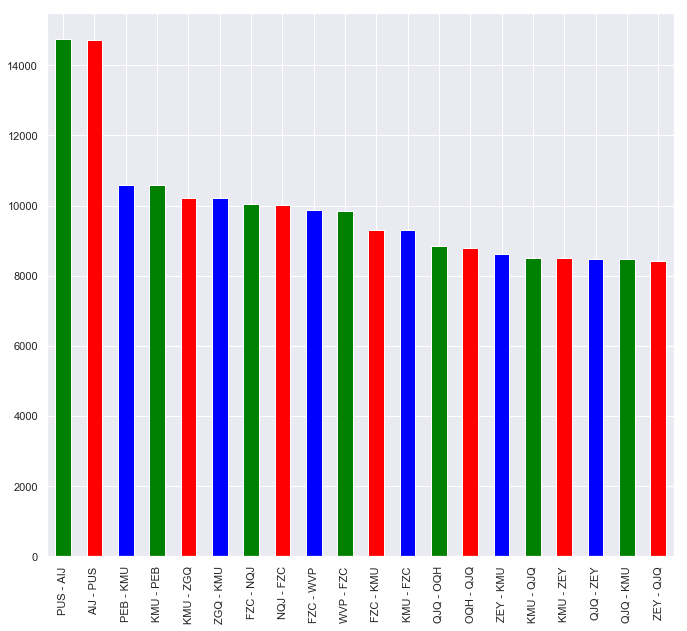

In [6]:
df1['pairs'] = df1['Orig'] + ' - ' + df1['Dest']
df1['pairs'].value_counts()[:20].plot(kind = 'bar', figsize = (10,10), color = ['green','red','blue'])

In [7]:
import plotly.express as px
df_sample = df1.sample(100000)
df_sample = df_sample[df_sample['Gross_gal'] < 8000]
fig = px.scatter(x=df_sample['Stage_length'], y=df_sample['Gross_gal'])
fig.show()

In [8]:
import plotly.express as px
df_sample = df1.sample(100000)
df_sample = df_sample[df_sample['Enroute_gal'] < 10000]
fig = px.scatter(x=df_sample['Stage_length'], y=df_sample['Enroute_gal'])
fig.show()

In [9]:
import plotly.express as px
df_sample = df1.sample(100000)
#df_sample = df_sample[df_sample['Cont_gal'] < 10000]
fig = px.scatter(x=df_sample['Stage_length'], y=df_sample['Cont_gal'])
fig.show()

In [10]:
import plotly.express as px
df_sample = df1.sample(100000)
#df_sample = df_sample[df_sample['Cont_gal'] < 10000]
fig = px.scatter(x=df_sample['Stage_length'], y=df_sample['Tanker_gal'])
fig.show()

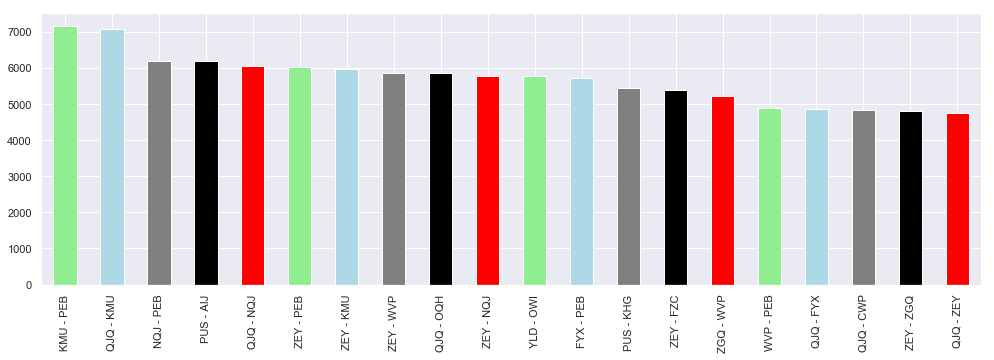

In [11]:
df1[df1['Tanker_gal'] > 0]['pairs'].value_counts().head(20).plot(kind = 'bar', colors = ['lightgreen','lightblue','grey','black','red'], figsize = (15,5))

In [12]:
df1['ACFT'].value_counts()

73W    2474416
73H     742611
7M8      40594
Name: ACFT, dtype: int64

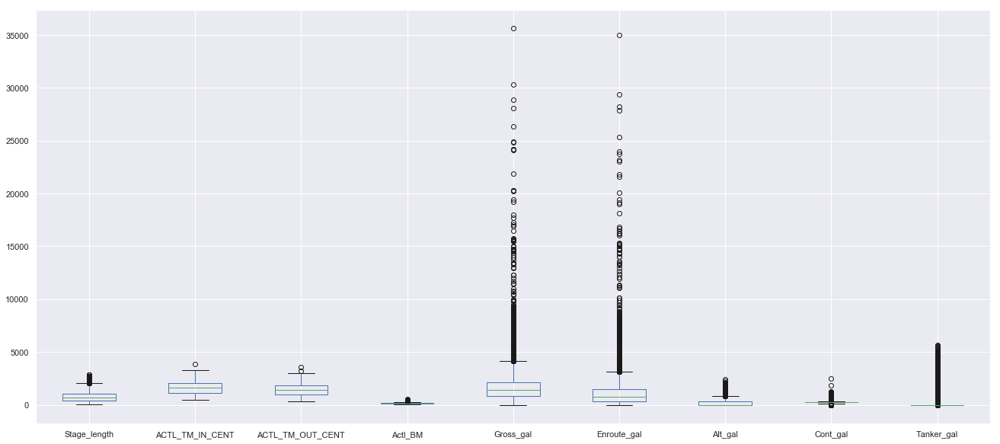

In [13]:
ax = df1.plot.box(['ACFT','Gross_gal'], figsize = (20,10))

In [14]:
def year_month(value):
    value = str(value)
    return str(value[:7])

df1['year_month'] = df1['Dep_dt'].map(year_month)

In [15]:
import datetime

def date_format(value):
    value = str(value)
    year = int(value[:4])
    month = int(value[5:7])
    day = int(value[8:])
    
    #print(year,month,day)
    date = datetime.date(year,month, day)
    return date 


df1['Dep_dt'] = df1['Dep_dt'].map(date_format)
#df1.plot(df1['Dep_dt'], df1['Gross_gal'])


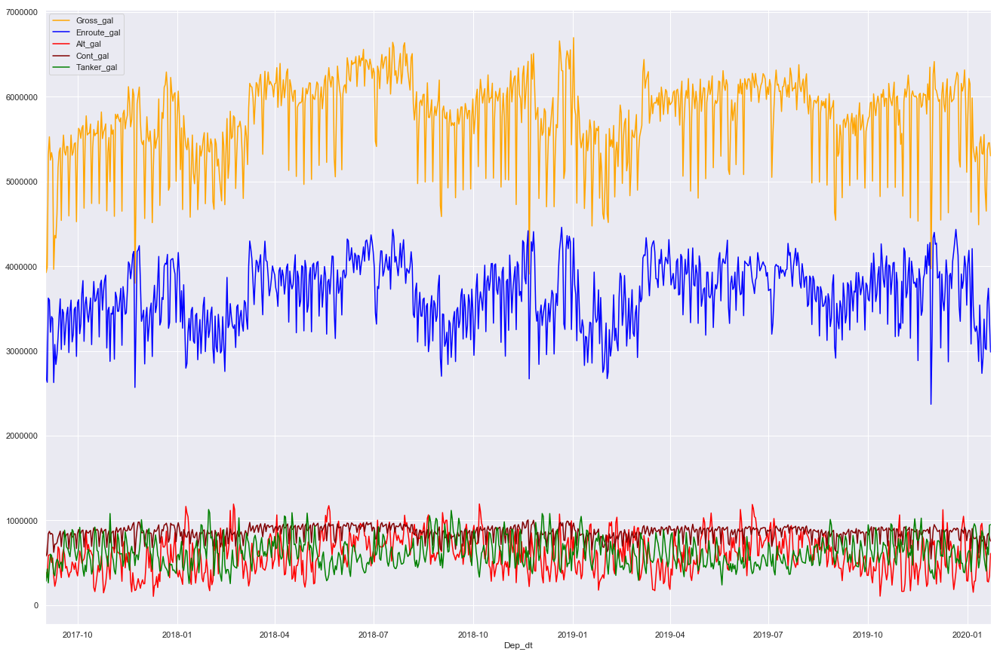

In [16]:
df1.groupby('Dep_dt').sum().plot(y = ['Gross_gal','Enroute_gal','Alt_gal','Cont_gal','Tanker_gal'], figsize = (20,15), colors = ['orange','blue','red','maroon','green'])



In [17]:
a_list = df1['pairs'].value_counts().index[:51]
def top_stations(value): 
    if value in a_list: 
        return 1 
    return 0 

df1['top_50'] = df1['pairs'].map(top_stations)
top_sta = df1[df1['top_50'] == 1]

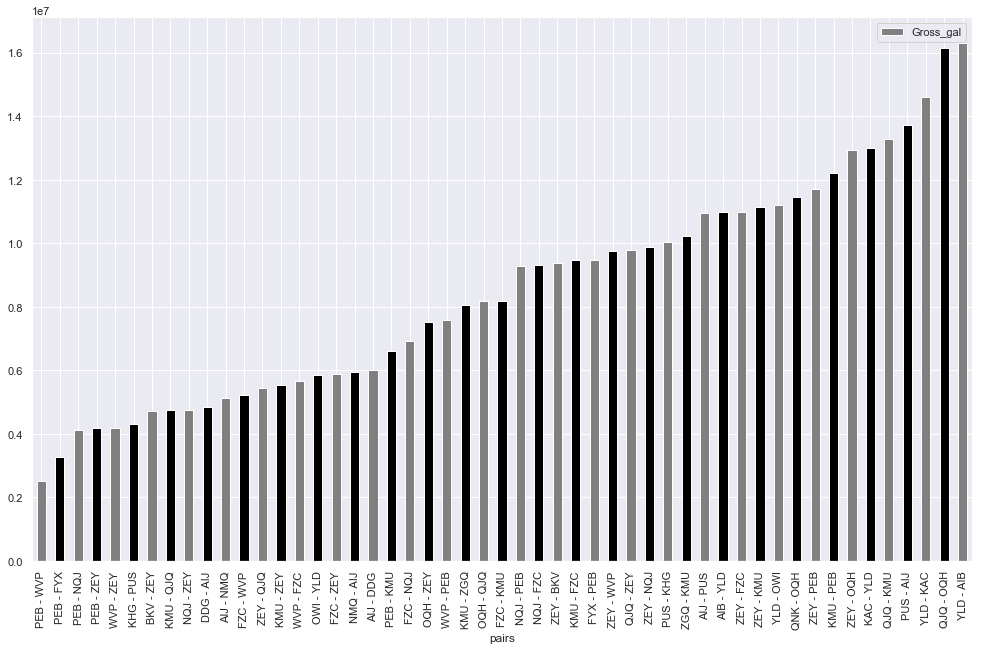

In [18]:
top_sta.groupby('pairs').sum().sort_values(by = 'Gross_gal').plot(kind = 'bar',y = 'Gross_gal', figsize = (15,10), colors = ['grey','black'])



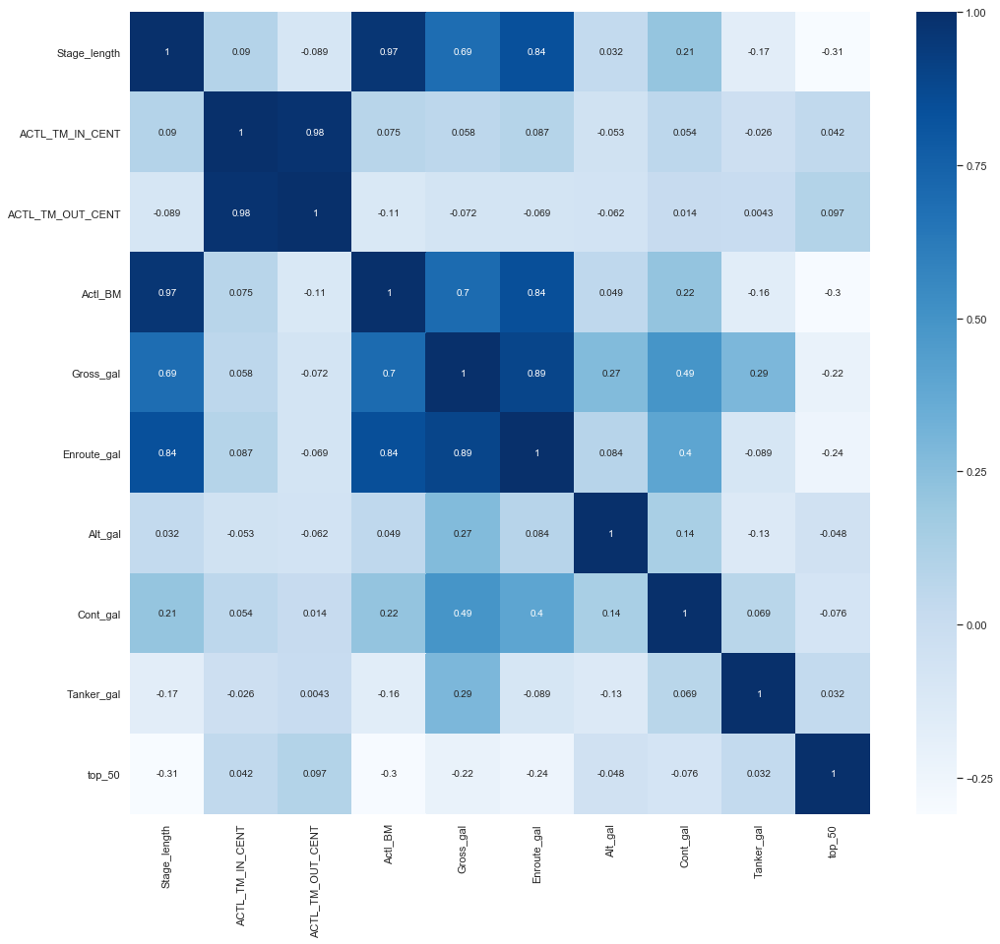

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
corr = df1.corr()

# plot the heatmap
fig, ax = plt.subplots(figsize=(15,15)) 
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,cmap = "Blues", annot = True)

In [20]:
def hour_of_the_day(time):
    time = str(time)
    return int(time[:-2])

df1['hour_out'] = df1['ACTL_TM_OUT_CENT'].map(hour_of_the_day)
df1['hour_in'] = df1['ACTL_TM_IN_CENT'].map(hour_of_the_day)

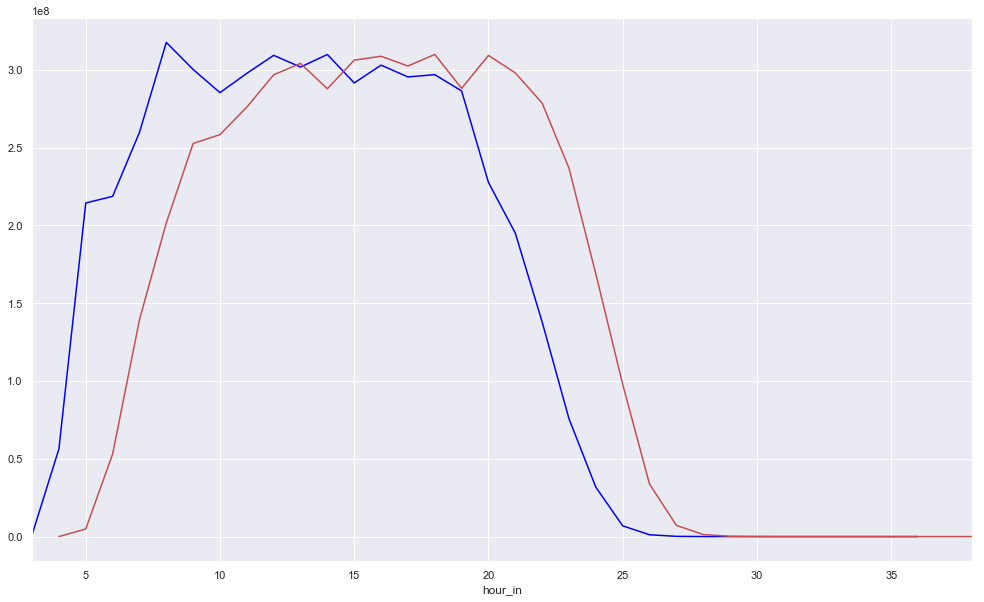

In [21]:
fig, ax = plt.subplots(figsize=(15,10)) 
df1.groupby('hour_out').sum()['Gross_gal'].plot(color = ['blue'])
df1.groupby('hour_in').sum()['Gross_gal'].plot(color = ['r'])

In [22]:
print('There are',len(df1['Tail'].value_counts()),'tail numbers present in the dataset.')

There are 754 tail numbers present in the dataset.


In [23]:
df1[df1['hour_in'] > 24]

,Dep_dt,Orig,Dest,Tail,Stage_length,ACTL_TM_IN_CENT,ACTL_TM_OUT_CENT,ACFT,Actl_BM,Gross_gal,Enroute_gal,Alt_gal,Cont_gal,Tanker_gal,pairs,year_month,top_50,hour_out,hour_in
75,2017-09-15,OQH,FTD,N09303,1056,2524,2252,73W,152,1646.9,1389,0.0,258.4,0.0,OQH - FTD,2017-09,0,22,25
230,2017-10-10,QNK,FZC,N09303,1963,2633,2205,73W,268,3156.6,2630,232.2,294.1,0.0,QNK - FZC,2017-10,0,22,26
262,2017-10-16,QJQ,OQH,N09303,641,2551,2417,73W,94,2218.4,913,0.0,330.1,974.8,QJQ - OQH,2017-10,1,24,25
275,2017-10-18,PEB,PDT,N09303,742,2501,2303,73W,118,1731.8,943,450.9,338.2,0.0,PEB - PDT,2017-10,0,23,25
290,2017-10-20,PEB,FTD,N09303,605,2516,2330,73W,106,2054.9,1288,483.6,283.5,0.0,PEB - FTD,2017-10,0,23,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3257445,2019-12-23,PDT,PEB,N92669,742,2606,2407,73W,119,1653.7,690,0.0,225.9,737.9,PDT - PEB,2019-12,0,24,26
3257499,2020-01-01,FZC,BUX,N92669,946,2549,2342,73W,127,220.4,43,0.0,177.6,0.0,FZC - BUX,2020-01,0,23,25
3257507,2020-01-02,QJQ,EVE,N92669,1358,2552,2254,73W,178,2860.9,2035,592.4,233.9,0.0,QJQ - EVE,2020-01,0,22,25
3257546,2020-01-09,QJQ,OQH,N92669,641,2539,2358,73W,101,1952.4,836,697.5,232.5,186.0,QJQ - OQH,2020-01,1,23,25


In [24]:
df1['Gross_gal'].iloc[0]

536.3

# Feature Engineering

In [25]:
df1.head()

,Dep_dt,Orig,Dest,Tail,Stage_length,ACTL_TM_IN_CENT,ACTL_TM_OUT_CENT,ACFT,Actl_BM,Gross_gal,Enroute_gal,Alt_gal,Cont_gal,Tanker_gal,pairs,year_month,top_50,hour_out,hour_in
0,2017-09-01,FYX,ZEY,N09303,240,1005,844,73W,81,536.3,265,0.0,271.4,0.0,FYX - ZEY,2017-09,0,8,10
1,2017-09-01,ZEY,KMU,N09303,274,1139,1043,73W,56,1145.6,495,378.2,272.4,0.0,ZEY - KMU,2017-09,1,10,11
2,2017-09-01,KMU,DWF,N09303,1419,1520,1221,73W,179,1923.3,1695,0.0,228.3,0.0,KMU - DWF,2017-09,0,12,15
3,2017-09-01,DWF,ZEY,N09303,1213,1838,1556,73W,162,2115.7,1883,0.0,233.1,0.0,DWF - ZEY,2017-09,0,15,18
4,2017-09-01,ZEY,FSG,N09303,1051,2140,1925,73W,135,2703.5,1432,0.0,241.4,1029.7,ZEY - FSG,2017-09,0,19,21


In [26]:
df3 = df1.pivot_table(index = ['Orig','year_month'], aggfunc = sum)

In [27]:
df3.iloc[0]

ACTL_TM_IN_CENT     3468097.0
ACTL_TM_OUT_CENT    2924502.0
Actl_BM              325195.0
Alt_gal              358237.8
Cont_gal             584802.5
Enroute_gal         2810413.0
Gross_gal           4294595.0
Stage_length        2234991.0
Tanker_gal           541128.6
hour_in               34002.0
hour_out              28542.0
top_50                  189.0
Name: (AIB, 2017-09), dtype: float64

In [28]:
def month(value): 
    return value[-2:]

df1['month'] = df1['year_month'].map(month)

In [29]:
df1_arima = pd.pivot_table(df1,index = 'Orig', columns = ['year_month'], aggfunc = sum, values = ['Gross_gal'])

In [30]:

sorted(df1[df1['Orig'] == 'API']['Dep_dt'])

[datetime.date(2018, 4, 26), datetime.date(2019, 12, 20)]

In [31]:
from datetime import datetime as dt
df1['day_of_week'] = df1['Dep_dt'].apply(lambda x: dt.weekday(x))

In [32]:
df1.columns

Index(['Dep_dt', 'Orig', 'Dest', 'Tail', 'Stage_length', 'ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT', 'ACFT', 'Actl_BM', 'Gross_gal', 'Enroute_gal',
       'Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs', 'year_month', 'top_50',
       'hour_out', 'hour_in', 'month', 'day_of_week'],
      dtype='object')

In [33]:
b = df1.groupby(['Orig']).sum()

In [34]:
columns_list = [ 'Actl_BM', 'Gross_gal', 'Enroute_gal',
       'Alt_gal', 'Cont_gal', 'Tanker_gal']

for x in columns_list: 
    df1_arima[x] = b[x]

In [35]:
#df1_arima.to_csv('/Users/Aifaz/Desktop/df1_arima.csv')

# Model Creation

In [38]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.utils import shuffle
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression

from subprocess import check_output
from sklearn.model_selection import train_test_split
import lightgbm as lgb
from sklearn import preprocessing

In [39]:
df1['Dep_dt']= pd.to_datetime(df1['Dep_dt']) 

In [40]:
df1['year'] = df1['Dep_dt'].dt.year
df1['day_of_year'] = df1['Dep_dt'].dt.dayofyear
df1['weekday'] = df1['Dep_dt'].dt.weekday
df1['week_of_year'] = df1['Dep_dt'].dt.week
df1['day_of_month'] = df1['Dep_dt'].dt.day
df1['quarter'] = df1['Dep_dt'].dt.quarter
#df1.drop('activation_date', axis=1, inplace=True)

In [42]:
df1.columns

Index(['Dep_dt', 'Orig', 'Dest', 'Tail', 'Stage_length', 'ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT', 'ACFT', 'Actl_BM', 'Gross_gal', 'Enroute_gal',
       'Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs', 'year_month', 'top_50',
       'hour_out', 'hour_in', 'month', 'day_of_week', 'year', 'day_of_year',
       'weekday', 'week_of_year', 'day_of_month', 'quarter'],
      dtype='object')

In [90]:
cat_columns = df1.dtypes[df1.dtypes == 'object'].index

In [44]:
qnk = df1[df1['Orig'] == 'QNK']

In [46]:
qnk

,Dep_dt,Orig,Dest,Tail,Stage_length,ACTL_TM_IN_CENT,ACTL_TM_OUT_CENT,ACFT,Actl_BM,Gross_gal,...,hour_out,hour_in,month,day_of_week,year,day_of_year,weekday,week_of_year,day_of_month,quarter
23,2017-09-05,QNK,NWF,N09303,772,1421,1224,73W,117,1537.3,...,12,14,09,1,2017,248,1,36,5,3
25,2017-09-06,QNK,HCR,N09303,302,734,621,73W,73,1021.5,...,6,7,09,2,2017,249,2,36,6,3
27,2017-09-06,QNK,WAS,N09303,498,1108,950,73W,78,358.3,...,9,11,09,2,2017,249,2,36,6,3
35,2017-09-07,QNK,YLD,N09303,650,2206,2036,73W,90,875.5,...,20,22,09,3,2017,250,3,36,7,3
55,2017-09-13,QNK,BUX,N09303,1193,1054,819,73W,155,2023.2,...,8,10,09,2,2017,256,2,37,13,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3257539,2020-01-08,QNK,EVE,N92669,371,2311,2151,73W,80,246.9,...,21,23,01,2,2020,8,2,2,8,1
3257541,2020-01-09,QNK,EVE,N92669,371,1113,946,73W,87,505.8,...,9,11,01,3,2020,9,3,2,9,1
3257586,2020-01-16,QNK,GXQ,N92669,450,1925,1802,73W,83,658.4,...,18,19,01,3,2020,16,3,3,16,1
3257604,2020-01-20,QNK,ZMB,N92669,628,856,708,73W,108,1254.3,...,7,8,01,0,2020,20,0,4,20,1


In [61]:
first = df1['Orig'].value_counts().head(10).index
two = df1['Orig'].value_counts().index[20:30]
three = df1['Orig'].value_counts().index[30:40]
four = df1['Orig'].value_counts().index[40:50]
five = df1['Orig'].value_counts().index[50:60]
six = df1['Orig'].value_counts().index[60:70]
seven = df1['Orig'].value_counts().index[70:80]
eight = df1['Orig'].value_counts().index[80:90]
nine = df1['Orig'].value_counts().index[90:]

In [63]:
def map_airport(value): 
    if value in first: 
        return 1
    if value in two: 
        return 2
    if value in three: 
        return 3
    if value in four: 
        return 4
    if value in five: 
        return 5
    if value in six: 
        return 6
    if value in seven: 
        return 7
    if value in eight: 
        return 8
    if value in nine: 
        return 9
    
df1['mapping'] = df1.Orig.map(map_airport)

In [74]:
qnk = df1[(df1['mapping'] == 5) |(df1['mapping'] == 6) ]

In [75]:
X = qnk.drop(['Gross_gal', 'Enroute_gal','Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs','ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT'], axis=1)
y = qnk.Gross_gal

In [76]:
def column_index(df, query_cols):
    cols = df.columns.values
    sidx = np.argsort(cols)
    return sidx[np.searchsorted(cols, query_cols, sorter=sidx)]

categorical_features_indices = column_index(X, cat_columns)

# CatBoost Model

In [77]:
from catboost import CatBoostRegressor

In [85]:
X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.30, random_state=42)
model=CatBoostRegressor(iterations=50, depth=10, learning_rate=0.4, loss_function='RMSE')
model.fit(X_train, y_train,cat_features=categorical_features_indices,eval_set=(X_valid, y_valid),plot=True);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 821.2900422	test: 810.3907989	best: 810.3907989 (0)	total: 805ms	remaining: 39.5s
1:	learn: 734.7561148	test: 724.8081939	best: 724.8081939 (1)	total: 1.17s	remaining: 28s
2:	learn: 693.8539283	test: 684.1809689	best: 684.1809689 (2)	total: 1.25s	remaining: 19.7s
3:	learn: 668.8164119	test: 660.8522378	best: 660.8522378 (3)	total: 1.54s	remaining: 17.7s
4:	learn: 652.9082714	test: 645.6831022	best: 645.6831022 (4)	total: 1.84s	remaining: 16.5s
5:	learn: 644.2576373	test: 637.4774856	best: 637.4774856 (5)	total: 2.06s	remaining: 15.1s
6:	learn: 637.3264854	test: 631.3098191	best: 631.3098191 (6)	total: 2.25s	remaining: 13.9s
7:	learn: 632.2920643	test: 626.9901842	best: 626.9901842 (7)	total: 2.42s	remaining: 12.7s
8:	learn: 628.1848301	test: 623.8371924	best: 623.8371924 (8)	total: 2.57s	remaining: 11.7s
9:	learn: 624.9844570	test: 620.8546180	best: 620.8546180 (9)	total: 2.72s	remaining: 10.9s
10:	learn: 622.6935387	test: 619.1128625	best: 619.1128625 (10)	total: 2.87s	remai

In [68]:
model =  CatBoostRegressor(iterations=700,
                             learning_rate=0.01,
                             depth=16,
                             eval_metric='RMSE',
                             random_seed = 42,
                             bagging_temperature = 0.2,
                             od_type='Iter',
                             metric_period = 75,
                             od_wait=100)
model.fit(X_train, y_train,
                 eval_set=(X_valid, y_valid),
                 cat_features=categorical_features_indices,
                 use_best_model=True)

0:	learn: 1009.3211815	test: 1005.7603700	best: 1005.7603700 (0)	total: 3.6s	remaining: 41m 59s
75:	learn: 720.7536299	test: 715.3221607	best: 715.3221607 (75)	total: 3m 4s	remaining: 25m 11s
150:	learn: 627.3225981	test: 624.1591843	best: 624.1591843 (150)	total: 7m 1s	remaining: 25m 34s
225:	learn: 594.3106053	test: 596.2943345	best: 596.2943345 (225)	total: 11m 14s	remaining: 23m 35s
300:	learn: 576.4715205	test: 585.3252300	best: 585.3252300 (300)	total: 15m 46s	remaining: 20m 55s
375:	learn: 563.5638907	test: 579.9565469	best: 579.9565469 (375)	total: 20m 42s	remaining: 17m 50s
450:	learn: 552.7977365	test: 576.4958916	best: 576.4958916 (450)	total: 25m 57s	remaining: 14m 19s
525:	learn: 543.0155385	test: 573.8766319	best: 573.8766319 (525)	total: 31m 54s	remaining: 10m 33s
600:	learn: 533.8134068	test: 572.0107956	best: 572.0107956 (600)	total: 39m 24s	remaining: 6m 29s
675:	learn: 524.3454729	test: 570.4344827	best: 570.4344827 (675)	total: 46m 18s	remaining: 1m 38s
699:	learn: 

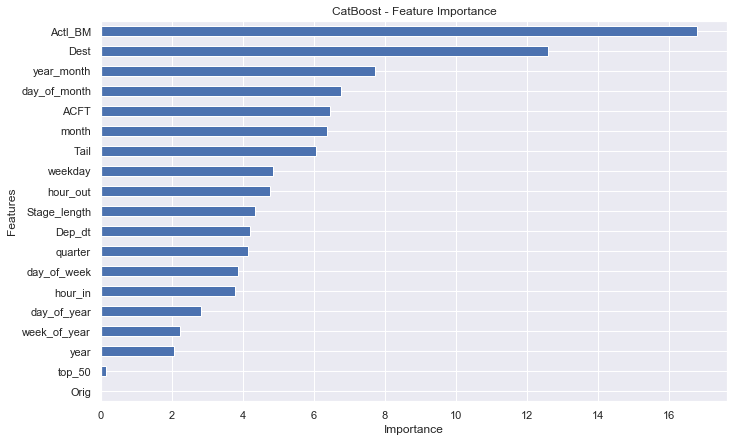

In [70]:
fea_imp = pd.DataFrame({'imp': model.feature_importances_, 'col': X.columns})
fea_imp = fea_imp.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
fea_imp.plot(kind='barh', x='col', y='imp', figsize=(10, 7), legend=None)
plt.title('CatBoost - Feature Importance')
plt.ylabel('Features')
plt.xlabel('Importance');

# LightGBM

In [86]:
label_encoder = preprocessing.LabelEncoder()

for col in cat_columns:
    df1[col].fillna("unknown")
    df1[col] = label_encoder.fit_transform(df1[col].astype(str))

CREATING THE BUCKETS

In [87]:
first = df1['Orig'].value_counts().head(10).index
two = df1['Orig'].value_counts().index[20:30]
three = df1['Orig'].value_counts().index[30:40]
four = df1['Orig'].value_counts().index[40:50]
five = df1['Orig'].value_counts().index[50:60]
six = df1['Orig'].value_counts().index[60:70]
seven = df1['Orig'].value_counts().index[70:80]
eight = df1['Orig'].value_counts().index[80:90]
nine = df1['Orig'].value_counts().index[90:]


In [88]:
def map_airport(value): 
    if value in first: 
        return 1
    if value in two: 
        return 2
    if value in three: 
        return 3
    if value in four: 
        return 4
    if value in five: 
        return 5
    if value in six: 
        return 6
    if value in seven: 
        return 7
    if value in eight: 
        return 8
    if value in nine: 
        return 9
    
df1['mapping'] = df1.Orig.map(map_airport)

1st bucket

In [182]:
qnk = df1[(df1['mapping'] == 1) ]# |(df1['mapping'] == 2) ]
qnk = qnk[qnk.Gross_gal.between(qnk.Gross_gal.quantile(.000), qnk.Gross_gal.quantile(.95))] # without outliers

X = qnk.drop(['Dep_dt','Gross_gal', 'Enroute_gal','Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs','ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT','Actl_BM'], axis=1)
y = qnk.Gross_gal
feature_names = X.columns.tolist()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.25, random_state=42)
    
# LightGBM dataset formatting 
lgtrain = lgb.Dataset(X_train, y_train,
                feature_name=feature_names,
                categorical_feature = cat_columns)
lgvalid = lgb.Dataset(X_valid, y_valid,
                feature_name=feature_names,
                categorical_feature = cat_columns)

params = {
    'objective' : 'regression',
    'metric' : 'rmse',
    'num_leaves' : 40,
    'max_depth': 20,
    'learning_rate' : 0.01,
    'feature_fraction' : 0.6,
    'verbosity' : -1,
    'num_iterations': 20000
}
lgb_clf = lgb.train(
    params,
    lgtrain,
    valid_sets=[lgtrain, lgvalid],
    valid_names=["train", "valid"],
    early_stopping_rounds=500,
    verbose_eval=500
)
print("RMSE of the validation set:", np.sqrt(mean_squared_error(y_valid, lgb_clf.predict(X_valid))))


Training until validation scores don't improve for 500 rounds
[500]	train's rmse: 580.343	valid's rmse: 580.3
[1000]	train's rmse: 569.347	valid's rmse: 569.898
[1500]	train's rmse: 563.985	valid's rmse: 565.145
[2000]	train's rmse: 560.046	valid's rmse: 561.764
[2500]	train's rmse: 556.83	valid's rmse: 559.076
[3000]	train's rmse: 554.158	valid's rmse: 556.913
[3500]	train's rmse: 551.775	valid's rmse: 555.041
[4000]	train's rmse: 549.235	valid's rmse: 552.967
[4500]	train's rmse: 547.108	valid's rmse: 551.33
[5000]	train's rmse: 545.355	valid's rmse: 550.073
[5500]	train's rmse: 543.59	valid's rmse: 548.83
[6000]	train's rmse: 542.032	valid's rmse: 547.771
[6500]	train's rmse: 540.433	valid's rmse: 546.651
[7000]	train's rmse: 538.994	valid's rmse: 545.734
[7500]	train's rmse: 537.709	valid's rmse: 544.965
[8000]	train's rmse: 536.493	valid's rmse: 544.236
[8500]	train's rmse: 535.279	valid's rmse: 543.503
[9000]	train's rmse: 534.102	valid's rmse: 542.793
[9500]	train's rmse: 532.96

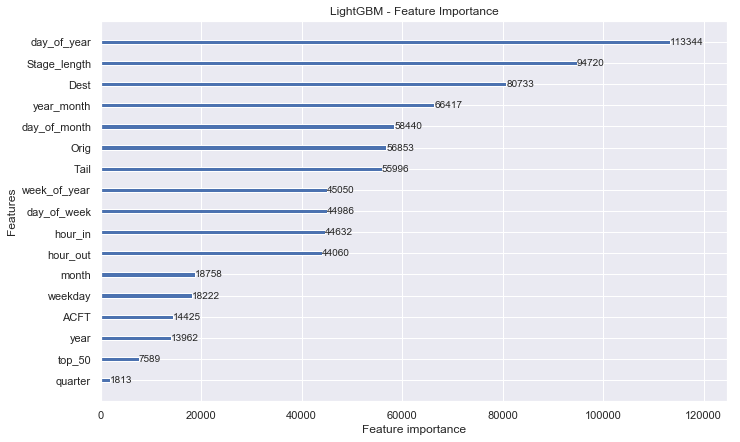

In [183]:
fig, ax = plt.subplots(figsize=(10, 7))
lgb.plot_importance(lgb_clf, max_num_features=30, ax=ax)
plt.title("LightGBM - Feature Importance");

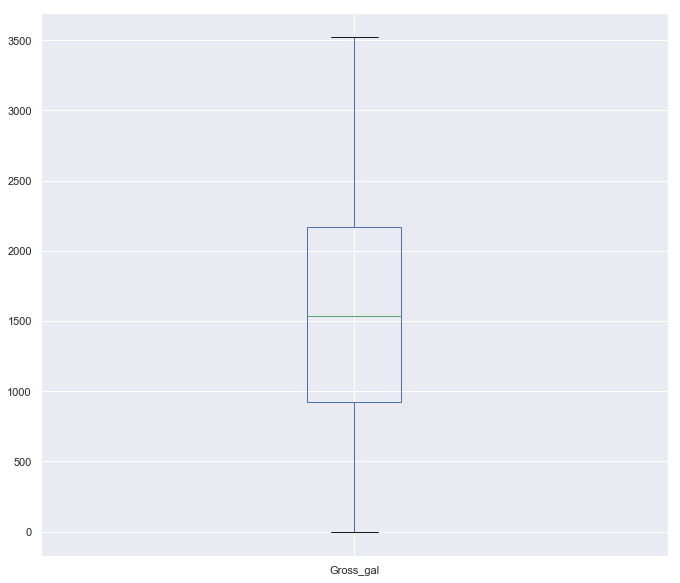

In [184]:
qnk.boxplot('Gross_gal', figsize = (10,10))

In [198]:
preds = lgb_clf.predict(X_valid)

from pandas import DataFrame
#DataFrame(y_valid, preds) 

a = DataFrame(preds)
a['y_valid'] = y_valid.reset_index()['Gross_gal']

a['prediction'] = a[0]

a.drop([0], axis = 1, inplace = True)

X_valid.reset_index(inplace = True)

valid = pd.concat([X_valid, a], axis=1)

gb = valid.groupby(['year','month']).sum()

gb['diff'] = abs(gb['y_valid'] - gb['prediction'])

gb_new = gb.sort_values(by = ['year','month'])

gb_new['percent_off'] = gb_new['diff'] / gb['y_valid']

gb_new

index    Orig    Dest     Tail  Stage_length  ACFT  \
year month                                                             
2017 8      17129851129  861854  765961  4025865       8515156  8259   
     9      19441870508  929434  847578  4524079       9227821  9426   
     10     18853018003  906113  827831  4453777       9289263  9224   
     11     19544783801  919050  839474  4616742       9506364  9358   
2018 0      19247322567  896366  828625  4484467       9350149  9104   
     1      16945988224  776522  720397  3874081       8139356  7813   
     2      20390154301  947717  872278  4648909      10089657  9647   
     3      19605572718  926966  852484  4516718       9614452  9413   
     4      20236462445  951132  877252  4615907       9837522  9734   
     5      20734803805  962926  883083  4725752      10168717  9882   
     6      20558782179  955424  871924  4720477      10110699  9775   
     7      19710358475  922506  853124  4518962       9476869  9698   
     8      18900003219  893871  800563  4271376       9002161  9151   
     9      20569691903  961283  859614  4629836       9670871  9908   
     10     20190301291  914447  847405  4529991       9672964  9373   
     11     20029562643  904800  841339  4451754       9448225  9387   
2019 0      19877283656  870443  812364  4323497       9120604  8975   
     1      17634860619  759343  709295  3820376       8011632  7860   
     2      20710026947  921633  856491  4649083       9949700  9297   
     3      19609757462  907115  837154  4405764       9445229  8685   
     4      20286426640  940413  852317  4527287       9736183  8898   
     5      19374136035  896448  826748  4403648       9298480  8858   
     6      20149551420  941501  866635  4627804       9715975  9291   
     7      19838349435  941523  853656  4485705       9442423  9060   
     8      18724498764  900262  828200  4314730       9036619  8763   
     9      20356044903  948973  865618  4614504       9760209  9143   
     10     18496795216  866447  801761  4297553       9321937  8641   
     11     19462376835  901021  844687  4591963       9866676  9070   
2020 0      13413156474  617641  578925  3090220       6484229  6173   

            year_month  top_50  hour_out  hour_in  ...  day_of_year  weekday  \
year month                                         ...                         
2017 8               0    2036    152580   174059  ...      2772986    32413   
     9           11953    2380    169258   192725  ...      3453170    34124   
     10          23512    2261    167156   190378  ...      3755933    34461   
     11          35928    2244    171328   195413  ...      4193305    37225   
2018 0           46864    2254    166402   190193  ...       186115    31508   
     1           50995    2014    145380   166012  ...       466347    29197   
     2           74268    2323    178928   204051  ...       932206    37842   
     3           83937    2313    173640   197905  ...      1264716    35124   
     4           98648    2382    178787   203637  ...      1676052    34688   
     5          112725    2351    180824   206324  ...      2086307    38406   
     6          124230    2223    180408   205707  ...      2449437    36063   
     7          132528    2333    173266   197335  ...      2744699    35887   
     8          136764    2241    163000   185546  ...      2948140    35019   
     9          159705    2375    173694   198055  ...      3549955    33757   
     10         167230    2203    168953   193266  ...      3816702    35663   
     11         176760    2145    168937   192788  ...      4129064    35608   
2019 0          183872    2261    162691   185997  ...       178721    32946   
     1          171632    1990    144384   164997  ...       459560    29340   
     2          219114    2356    175468   200321  ...       914832    38418   
     3          222965    2228    169019   192762  ...      1237719    32634   
     4          242680   

In [199]:
gb_new['percent_off'].mean()

0.0030370447146984892

9th

In [200]:
qnk = df1[(df1['mapping'] == 9) ]# |(df1['mapping'] == 2) ]
qnk = qnk[qnk.Gross_gal.between(qnk.Gross_gal.quantile(.000), qnk.Gross_gal.quantile(.99))] # without outliers

X = qnk.drop(['Dep_dt','Gross_gal', 'Enroute_gal','Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs','ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT','Actl_BM'], axis=1)
y = qnk.Gross_gal
feature_names = X.columns.tolist()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.25, random_state=42)
    
# LightGBM dataset formatting 
lgtrain = lgb.Dataset(X_train, y_train,
                feature_name=feature_names,
                categorical_feature = cat_columns)
lgvalid = lgb.Dataset(X_valid, y_valid,
                feature_name=feature_names,
                categorical_feature = cat_columns)

params = {
    'objective' : 'regression',
    'metric' : 'rmse',
    'num_leaves' : 40,
    'max_depth': 20,
    'learning_rate' : 0.01,
    'feature_fraction' : 0.6,
    'verbosity' : -1,
    'num_iterations': 20000
}
lgb_clf = lgb.train(
    params,
    lgtrain,
    valid_sets=[lgtrain, lgvalid],
    valid_names=["train", "valid"],
    early_stopping_rounds=500,
    verbose_eval=500
)
print("RMSE of the validation set:", np.sqrt(mean_squared_error(y_valid, lgb_clf.predict(X_valid))))


Training until validation scores don't improve for 500 rounds
[500]	train's rmse: 471.612	valid's rmse: 513.101
[1000]	train's rmse: 440.332	valid's rmse: 507.5
[1500]	train's rmse: 419.209	valid's rmse: 505.618
[2000]	train's rmse: 401.029	valid's rmse: 503.812
[2500]	train's rmse: 385.857	valid's rmse: 503.256
[3000]	train's rmse: 372.204	valid's rmse: 502.375
[3500]	train's rmse: 359.383	valid's rmse: 501.931
[4000]	train's rmse: 346.714	valid's rmse: 501.851
[4500]	train's rmse: 335.284	valid's rmse: 501.627
[5000]	train's rmse: 323.43	valid's rmse: 501.2
[5500]	train's rmse: 314.412	valid's rmse: 501.64
Early stopping, best iteration is:
[5184]	train's rmse: 319.889	valid's rmse: 501.178
RMSE of the validation set: 501.1780846330887


In [201]:
preds9 = lgb_clf.predict(X_valid)

from pandas import DataFrame
#DataFrame(y_valid, preds) 

a9 = DataFrame(preds9)
a9['y_valid'] = y_valid.reset_index()['Gross_gal']

a9['prediction'] = a9[0]

a9.drop([0], axis = 1, inplace = True)

X_valid.reset_index(inplace = True)

valid = pd.concat([X_valid, a9], axis=1)

gb9 = valid.groupby(['year','month']).sum()

gb9['diff'] = abs(gb9['y_valid'] - gb9['prediction'])

gb_new9 = gb9.sort_values(by = ['year','month'])

gb_new9['percent_off'] = gb_new9['diff'] / gb9['y_valid']

gb_new9

index   Orig   Dest    Tail  Stage_length  ACFT  year_month  \
year month                                                                    
2017 8      166138857   9521  10830   44480         85021   122           0   
     9      190962481  11133  13160   52291        106851   143         149   
     10     215919691  12986  15072   64893        126765   164         340   
     11     247767698  12670  16998   68821        135980   174         546   
2018 0      235286063  13759  16741   66825        133296   170         712   
     1      213594366  12339  13852   58530        131274   153         790   
     2      285050823  16058  19113   73435        157997   188        1212   
     3      295398123  15200  18723   77186        149262   197        1428   
     4      252213716  13630  15789   58669        133496   164        1400   
     5      217297328  12231  16017   58394        131888   174        1584   
     6      208769929  11392  16117   60848        139188   172        1730   
     7      191290654  10704  14127   58531        118982   153        1694   
     8      169766012   7894  12500   46519         87763   109        1536   
     9      175139190   9052  13621   53200        101431   140        1833   
     10     192047129   9435  13301   53165        115582   139        1974   
     11     242523930  13004  16769   62104        151716   175        2715   
2019 0      215996624   9410  15137   55372        135233   132        2512   
     1      167624702   7692  11676   51306         97533   100        2074   
     2      228518036   9498  13519   58276        127516   118        2754   
     3      223811008   7132  13734   55374        124694   114        2869   
     4      330198235   7983  14982   70674        136100   101        3800   
     5      371510323   9200  17802   85955        157230   124        4515   
     6      432041301  10815  17902   97596        177833   115        5192   
     7      391389894   9274  16590   82851        166515    89        4922   
     8      348772055   7574  12433   71231        123215    72        4344   
     9      345590852   7953  15186   74596        133795    88        4750   
     10     436956618  11897  18601   93438        178508   130        6448   
     11     484176726  13591  20885  108490        192113   138        7587   
2020 0      311536705   8864  14138   70077        130942    96        5152   

            top_50  hour_out  hour_in  ...  day_of_year  weekday  \
year month                             ...                         
2017 8           0      1461     1700  ...        31845      344   
     9           0      1787     2092  ...        43171      439   
     10          0      2090     2445  ...        54243      507   
     11          0      2187     2561  ...        63693      567   
2018 0           0      2175     2546  ...         2924      520   
     1           0      1914     2274  ...         7182      535   
     2           0      2402     2853  ...        15311      689   
     3           0      2530     2947  ...        21421      637   
     4           0      2099     2480  ...        23831      549   
     5           0      2181     2542  ...        29292      549   
     6           0      2205     2576  ...        33939      474   
     7           0      1864     2180  ...        34944      462   
     8           0      1547     1792  ...        33073      395   
     9           0      1704     1984  ...        40801      417   
     10          0      1786     2104  ...        45116      427   
     11          0      2173     2590  ...        63392      582   
2019 0           0      1870     2216  ...         2404      493   
     1           0      1529     1800  ...         5506      403   
     2           0      1940     2289  ...        11415      523   
     3           0      1906     2237  ...        15897      413   
     4           0      2704     3063  ...        25904      606   
  

In [202]:
gb_new9['percent_off'].mean()

0.035516652618364876

8th

In [203]:
qnk = df1[(df1['mapping'] == 8) ]# |(df1['mapping'] == 2) ]
qnk = qnk[qnk.Gross_gal.between(qnk.Gross_gal.quantile(.000), qnk.Gross_gal.quantile(.99))] # without outliers

X = qnk.drop(['Dep_dt','Gross_gal', 'Enroute_gal','Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs','ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT','Actl_BM'], axis=1)
y = qnk.Gross_gal
feature_names = X.columns.tolist()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.25, random_state=42)
    
# LightGBM dataset formatting 
lgtrain = lgb.Dataset(X_train, y_train,
                feature_name=feature_names,
                categorical_feature = cat_columns)
lgvalid = lgb.Dataset(X_valid, y_valid,
                feature_name=feature_names,
                categorical_feature = cat_columns)

params = {
    'objective' : 'regression',
    'metric' : 'rmse',
    'num_leaves' : 40,
    'max_depth': 20,
    'learning_rate' : 0.01,
    'feature_fraction' : 0.6,
    'verbosity' : -1,
    'num_iterations': 20000
}
lgb_clf = lgb.train(
    params,
    lgtrain,
    valid_sets=[lgtrain, lgvalid],
    valid_names=["train", "valid"],
    early_stopping_rounds=500,
    verbose_eval=500
)
print("RMSE of the validation set:", np.sqrt(mean_squared_error(y_valid, lgb_clf.predict(X_valid))))

preds8 = lgb_clf.predict(X_valid)

from pandas import DataFrame
#DataFrame(y_valid, preds) 

a8 = DataFrame(preds8)
a8['y_valid'] = y_valid.reset_index()['Gross_gal']

a8['prediction'] = a8[0]

a8.drop([0], axis = 1, inplace = True)

X_valid.reset_index(inplace = True)

valid = pd.concat([X_valid, a8], axis=1)

gb8 = valid.groupby(['year','month']).sum()

gb8['diff'] = abs(gb8['y_valid'] - gb8['prediction'])

gb_new8 = gb8.sort_values(by = ['year','month'])

gb_new8['percent_off'] = gb_new8['diff'] / gb8['y_valid']


print(gb_new8['percent_off'].mean())
gb_new9

Training until validation scores don't improve for 500 rounds
[500]	train's rmse: 523.092	valid's rmse: 542.465
[1000]	train's rmse: 494.157	valid's rmse: 532.782
[1500]	train's rmse: 474.417	valid's rmse: 528.905
[2000]	train's rmse: 457.364	valid's rmse: 526.388
[2500]	train's rmse: 442.927	valid's rmse: 524.969
[3000]	train's rmse: 430.382	valid's rmse: 524.256
[3500]	train's rmse: 419.546	valid's rmse: 523.702
[4000]	train's rmse: 408.526	valid's rmse: 523.624
Early stopping, best iteration is:
[3759]	train's rmse: 413.865	valid's rmse: 523.532
RMSE of the validation set: 523.5323016805978
0.031411834888548346


index   Orig   Dest    Tail  Stage_length  ACFT  year_month  \
year month                                                                    
2017 8      166138857   9521  10830   44480         85021   122           0   
     9      190962481  11133  13160   52291        106851   143         149   
     10     215919691  12986  15072   64893        126765   164         340   
     11     247767698  12670  16998   68821        135980   174         546   
2018 0      235286063  13759  16741   66825        133296   170         712   
     1      213594366  12339  13852   58530        131274   153         790   
     2      285050823  16058  19113   73435        157997   188        1212   
     3      295398123  15200  18723   77186        149262   197        1428   
     4      252213716  13630  15789   58669        133496   164        1400   
     5      217297328  12231  16017   58394        131888   174        1584   
     6      208769929  11392  16117   60848        139188   172        1730   
     7      191290654  10704  14127   58531        118982   153        1694   
     8      169766012   7894  12500   46519         87763   109        1536   
     9      175139190   9052  13621   53200        101431   140        1833   
     10     192047129   9435  13301   53165        115582   139        1974   
     11     242523930  13004  16769   62104        151716   175        2715   
2019 0      215996624   9410  15137   55372        135233   132        2512   
     1      167624702   7692  11676   51306         97533   100        2074   
     2      228518036   9498  13519   58276        127516   118        2754   
     3      223811008   7132  13734   55374        124694   114        2869   
     4      330198235   7983  14982   70674        136100   101        3800   
     5      371510323   9200  17802   85955        157230   124        4515   
     6      432041301  10815  17902   97596        177833   115        5192   
     7      391389894   9274  16590   82851        166515    89        4922   
     8      348772055   7574  12433   71231        123215    72        4344   
     9      345590852   7953  15186   74596        133795    88        4750   
     10     436956618  11897  18601   93438        178508   130        6448   
     11     484176726  13591  20885  108490        192113   138        7587   
2020 0      311536705   8864  14138   70077        130942    96        5152   

            top_50  hour_out  hour_in  ...  day_of_year  weekday  \
year month                             ...                         
2017 8           0      1461     1700  ...        31845      344   
     9           0      1787     2092  ...        43171      439   
     10          0      2090     2445  ...        54243      507   
     11          0      2187     2561  ...        63693      567   
2018 0           0      2175     2546  ...         2924      520   
     1           0      1914     2274  ...         7182      535   
     2           0      2402     2853  ...        15311      689   
     3           0      2530     2947  ...        21421      637   
     4           0      2099     2480  ...        23831      549   
     5           0      2181     2542  ...        29292      549   
     6           0      2205     2576  ...        33939      474   
     7           0      1864     2180  ...        34944      462   
     8           0      1547     1792  ...        33073      395   
     9           0      1704     1984  ...        40801      417   
     10          0      1786     2104  ...        45116      427   
     11          0      2173     2590  ...        63392      582   
2019 0           0      1870     2216  ...         2404      493   
     1           0      1529     1800  ...         5506      403   
     2           0      1940     2289  ...        11415      523   
     3           0      1906     2237  ...        15897      413   
     4           0      2704     3063  ...        25904      606   
  

7th

In [208]:
qnk = df1[(df1['mapping'] == 7) ]# |(df1['mapping'] == 2) ]
qnk = qnk[qnk.Gross_gal.between(qnk.Gross_gal.quantile(.000), qnk.Gross_gal.quantile(.99))] # without outliers

X = qnk.drop(['Dep_dt','Gross_gal', 'Enroute_gal','Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs','ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT','Actl_BM'], axis=1)
y = qnk.Gross_gal
feature_names = X.columns.tolist()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.25, random_state=42)
    
# LightGBM dataset formatting 
lgtrain = lgb.Dataset(X_train, y_train,
                feature_name=feature_names,
                categorical_feature = cat_columns)
lgvalid = lgb.Dataset(X_valid, y_valid,
                feature_name=feature_names,
                categorical_feature = cat_columns)

params = {
    'objective' : 'regression',
    'metric' : 'rmse',
    'num_leaves' : 40,
    'max_depth': 20,
    'learning_rate' : 0.001,
    'feature_fraction' : 0.6,
    'verbosity' : -1,
    'num_iterations': 20000
}
lgb_clf = lgb.train(
    params,
    lgtrain,
    valid_sets=[lgtrain, lgvalid],
    valid_names=["train", "valid"],
    early_stopping_rounds=500,
    verbose_eval=500
)
print("RMSE of the validation set:", np.sqrt(mean_squared_error(y_valid, lgb_clf.predict(X_valid))))

preds7 = lgb_clf.predict(X_valid)

from pandas import DataFrame
#DataFrame(y_valid, preds) 

a7 = DataFrame(preds7)
a7['y_valid'] = y_valid.reset_index()['Gross_gal']

a7['prediction'] = a7[0]

a7.drop([0], axis = 1, inplace = True)

X_valid.reset_index(inplace = True)

valid = pd.concat([X_valid, a7], axis=1)

gb7 = valid.groupby(['year','month']).sum()

gb7['diff'] = abs(gb7['y_valid'] - gb7['prediction'])

gb_new7 = gb7.sort_values(by = ['year','month'])

gb_new7['percent_off'] = gb_new7['diff'] / gb7['y_valid']


print(gb_new7['percent_off'].mean())
gb_new7

Training until validation scores don't improve for 500 rounds
[500]	train's rmse: 734.788	valid's rmse: 735.961
[1000]	train's rmse: 633.63	valid's rmse: 635.784
[1500]	train's rmse: 584.94	valid's rmse: 588.093
[2000]	train's rmse: 560.143	valid's rmse: 564.379
[2500]	train's rmse: 546.564	valid's rmse: 552.162
[3000]	train's rmse: 538.122	valid's rmse: 545.359
[3500]	train's rmse: 531.986	valid's rmse: 540.797
[4000]	train's rmse: 527.077	valid's rmse: 537.474
[4500]	train's rmse: 522.907	valid's rmse: 534.865
[5000]	train's rmse: 519.212	valid's rmse: 532.575
[5500]	train's rmse: 515.977	valid's rmse: 530.757
[6000]	train's rmse: 513.086	valid's rmse: 529.22
[6500]	train's rmse: 510.433	valid's rmse: 527.935
[7000]	train's rmse: 508.003	valid's rmse: 526.814
[7500]	train's rmse: 505.755	valid's rmse: 525.782
[8000]	train's rmse: 503.616	valid's rmse: 524.835
[8500]	train's rmse: 501.563	valid's rmse: 523.923
[9000]	train's rmse: 499.677	valid's rmse: 523.167
[9500]	train's rmse: 497

index   Orig   Dest    Tail  Stage_length  ACFT  year_month  \
year month                                                                    
2017 8      449104827  24294  21067  121231        220453   267           0   
     9      677238956  32970  31059  174728        299860   371         446   
     10     570117668  30107  31400  164439        311136   403         862   
     11     703648319  34011  33764  187975        335625   452        1470   
2018 0      682209404  32758  33754  187213        357711   470        1988   
     1      588370860  27356  28470  156280        290711   387        2080   
     2      728193708  35906  38141  187228        395510   468        3126   
     3      681863432  35277  32448  180787        345256   420        3297   
     4      738081542  38654  35952  194289        356004   467        4104   
     5      696068092  35637  31357  177392        337836   391        4158   
     6      809977907  38565  35322  196122        364644   425        5080   
     7      675939494  34293  30008  172833        302666   382        4862   
     8      600081099  30757  27158  148249        291338   372        4932   
     9      609911198  28397  25449  145784        250182   330        4979   
     10     585119976  30072  28033  152933        290975   363        5628   
     11     703346927  32856  33548  175183        328809   408        6870   
2019 0      617851495  30953  28989  156422        308638   386        6784   
     1      570883439  28074  27755  152774        272925   360        6715   
     2      727137145  34036  33872  183056        360511   424        8748   
     3      706993340  34977  34594  181963        353607   403        8930   
     4      694179403  36879  34655  172810        334119   409        9460   
     5      707684056  36894  32092  166104        332525   388        9597   
     6      664142918  35072  33501  169170        340144   399       10186   
     7      603488792  32474  27186  155200        275467   354        9476   
     8      576388470  29697  26274  143694        255142   351        9384   
     9      623676776  31214  26533  155914        273913   347       10375   
     10     582385402  27708  27487  153257        280041   352       10322   
     11     617018466  28666  29039  157925        305460   357       11286   
2020 0      410245828  20810  21164  110456        189130   239        8008   

            top_50  hour_out  hour_in  ...  day_of_year  weekday  \
year month                             ...                         
2017 8           0      3903     4484  ...        80666      951   
     9           0      5533     6346  ...       128822     1307   
     10          0      5339     6169  ...       137578     1294   
     11          0      6279     7196  ...       171426     1487   
2018 0           0      6248     7209  ...         7755     1385   
     1           0      5086     5876  ...        19083     1237   
     2           0      6555     7607  ...        39257     1685   
     3           0      6051     6995  ...        49758     1414   
     4           0      6582     7551  ...        69888     1531   
     5           0      5931     6819  ...        76861     1478   
     6           0      6463     7438  ...       100028     1450   
     7           0      5682     6489  ...       100559     1305   
     8           0      5167     5944  ...       106177     1284   
     9           0      4850     5541  ...       110625     1070   
     10          0      5229     5997  ...       128459     1287   
     11          0      5875     6770  ...       160562     1463   
2019 0           0      5387     6228  ...         6571     1286   
     1           0      4956     5697  ...        18124     1170   
     2           0      6035     7021  ...        36573     1573   
     3           0      5801     6746  ...        49324     1290   
     4           0      5896     6792  ...        64166     1460   
  

6TH

In [209]:
qnk = df1[(df1['mapping'] == 6) ]# |(df1['mapping'] == 2) ]
#qnk = qnk[qnk.Gross_gal.between(qnk.Gross_gal.quantile(.000), qnk.Gross_gal.quantile(.95))] # without outliers

X = qnk.drop(['Dep_dt','Gross_gal', 'Enroute_gal','Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs','ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT','Actl_BM'], axis=1)
y = qnk.Gross_gal
feature_names = X.columns.tolist()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.25, random_state=42)
    
# LightGBM dataset formatting 
lgtrain = lgb.Dataset(X_train, y_train,
                feature_name=feature_names,
                categorical_feature = cat_columns)
lgvalid = lgb.Dataset(X_valid, y_valid,
                feature_name=feature_names,
                categorical_feature = cat_columns)

params = {
    'objective' : 'regression',
    'metric' : 'rmse',
    'num_leaves' : 40,
    'max_depth': 20,
    'learning_rate' : 0.001,
    'feature_fraction' : 0.6,
    'verbosity' : -1,
    'num_iterations': 20000
}
lgb_clf = lgb.train(
    params,
    lgtrain,
    valid_sets=[lgtrain, lgvalid],
    valid_names=["train", "valid"],
    early_stopping_rounds=500,
    verbose_eval=500
)
print("RMSE of the validation set:", np.sqrt(mean_squared_error(y_valid, lgb_clf.predict(X_valid))))

preds6 = lgb_clf.predict(X_valid)

from pandas import DataFrame
#DataFrame(y_valid, preds) 

a6 = DataFrame(preds6)
a6['y_valid'] = y_valid.reset_index()['Gross_gal']

a6['prediction'] = a6[0]

a6.drop([0], axis = 1, inplace = True)

X_valid.reset_index(inplace = True)

valid = pd.concat([X_valid, a6], axis=1)

gb6 = valid.groupby(['year','month']).sum()

gb6['diff'] = abs(gb6['y_valid'] - gb6['prediction'])

gb_new6 = gb6.sort_values(by = ['year','month'])

gb_new6['percent_off'] = gb_new6['diff'] / gb6['y_valid']


print(gb_new6['percent_off'].mean())
gb_new6

Training until validation scores don't improve for 500 rounds
[500]	train's rmse: 762.595	valid's rmse: 792.598
[1000]	train's rmse: 675.477	valid's rmse: 708.912
[1500]	train's rmse: 632.807	valid's rmse: 668.587
[2000]	train's rmse: 610.664	valid's rmse: 648.045
[2500]	train's rmse: 597.985	valid's rmse: 636.604
[3000]	train's rmse: 589.063	valid's rmse: 628.682
[3500]	train's rmse: 582.783	valid's rmse: 623.209
[4000]	train's rmse: 577.513	valid's rmse: 618.818
[4500]	train's rmse: 573.237	valid's rmse: 615.348
[5000]	train's rmse: 569.564	valid's rmse: 612.536
[5500]	train's rmse: 566.302	valid's rmse: 610.106
[6000]	train's rmse: 563.432	valid's rmse: 608.148
[6500]	train's rmse: 560.932	valid's rmse: 606.53
[7000]	train's rmse: 558.727	valid's rmse: 605.147
[7500]	train's rmse: 556.609	valid's rmse: 603.86
[8000]	train's rmse: 554.818	valid's rmse: 602.875
[8500]	train's rmse: 553.139	valid's rmse: 602.003
[9000]	train's rmse: 551.549	valid's rmse: 601.207
[9500]	train's rmse: 55

index   Orig   Dest    Tail  Stage_length  ACFT  year_month  \
year month                                                                     
2017 8       830457883  51783  48618  209333        328976   461           0   
     9       989224489  58137  55267  241511        390285   555         644   
     10      996918941  54511  53275  245732        423718   542        1302   
     11     1048799835  56541  56284  270259        462745   589        2076   
2018 0       940423272  51260  49449  237055        421293   550        2496   
     1       874975721  47709  47296  214495        368343   509        2890   
     2       962237384  51938  49981  237172        431642   534        3714   
     3      1040822246  58369  55842  261982        458585   570        4788   
     4      1144225448  61497  56673  269371        472920   609        5768   
     5      1054534195  58576  57380  256290        509336   586        6300   
     6      1197198621  61640  61295  290308        554822   615        7530   
     7       992698268  59056  56388  265737        469866   615        7612   
     8       990220101  56988  55605  231450        424609   581        7836   
     9      1073026333  64633  62793  278372        485550   652        9594   
     10     1119308196  62553  61174  281010        500235   644       10332   
     11     1234003532  67312  63449  298097        515161   635       11490   
2019 0      1189973697  62079  58155  273835        472731   603       11504   
     1       986235673  49363  45492  213644        390202   478        9860   
     2      1220821588  61514  59735  285765        535650   620       13680   
     3      1213146241  67090  62805  287567        515125   617       14573   
     4      1208082527  67395  64372  292549        502919   624       15380   
     5      1218301423  64731  61015  297289        516286   588       16254   
     6      1283810539  68342  63205  299075        543691   612       17666   
     7      1264598905  71544  66870  302089        520195   630       18561   
     8       976479418  57351  52648  230145        384859   502       15192   
     9      1146679173  65678  58651  272766        477543   593       18500   
     10     1207443414  62643  59253  282134        529611   603       19734   
     11     1194715955  62902  60601  295339        538218   603       20628   
2020 0       844731407  44580  41882  195385        336963   399       14476   

            top_50  hour_out  hour_in  ...  day_of_year  weekday  \
year month                             ...                         
2017 8           0      6431     7327  ...       143279     1667   
     9           0      7330     8423  ...       186129     1889   
     10          0      7860     9046  ...       208075     1939   
     11          0      8317     9617  ...       242269     2157   
2018 0           0      7220     8386  ...        10028     1767   
     1           0      6704     7739  ...        26492     1715   
     2           0      7450     8634  ...        46717     1963   
     3           0      8269     9552  ...        72198     2116   
     4           0      8713    10031  ...        98099     2038   
     5           0      8397     9765  ...       116829     2260   
     6           0      9324    10811  ...       148713     2304   
     7           0      8281     9551  ...       157484     2036   
     8           0      8068     9254  ...       169043     2028   
     9           0      8972    10324  ...       212995     2117   
     10          0      8921    10346  ...       236164     2235   
     11          0      9276    10741  ...       268312     2358   
2019 0           0      8622     9987  ...        11181     2074   
     1           0      6831     7959  ...        26887     1757   
     2           0      9020    10559  ...        56964     2413   
     3           0      9165    10622  ...        80895     2180   
     4           0      9434    10880  .

5th

In [210]:
qnk = df1[(df1['mapping'] == 5) ]# |(df1['mapping'] == 2) ]
#qnk = qnk[qnk.Gross_gal.between(qnk.Gross_gal.quantile(.000), qnk.Gross_gal.quantile(.95))] # without outliers

X = qnk.drop(['Dep_dt','Gross_gal', 'Enroute_gal','Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs','ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT','Actl_BM'], axis=1)
y = qnk.Gross_gal
feature_names = X.columns.tolist()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.25, random_state=42)
    
# LightGBM dataset formatting 
lgtrain = lgb.Dataset(X_train, y_train,
                feature_name=feature_names,
                categorical_feature = cat_columns)
lgvalid = lgb.Dataset(X_valid, y_valid,
                feature_name=feature_names,
                categorical_feature = cat_columns)

params = {
    'objective' : 'regression',
    'metric' : 'rmse',
    'num_leaves' : 40,
    'max_depth': 20,
    'learning_rate' : 0.001,
    'feature_fraction' : 0.6,
    'verbosity' : -1,
    'num_iterations': 20000
}
lgb_clf = lgb.train(
    params,
    lgtrain,
    valid_sets=[lgtrain, lgvalid],
    valid_names=["train", "valid"],
    early_stopping_rounds=500,
    verbose_eval=500
)
print("RMSE of the validation set:", np.sqrt(mean_squared_error(y_valid, lgb_clf.predict(X_valid))))

preds5 = lgb_clf.predict(X_valid)

from pandas import DataFrame
#DataFrame(y_valid, preds) 

a5 = DataFrame(preds5)
a5['y_valid'] = y_valid.reset_index()['Gross_gal']

a5['prediction'] = a5[0]

a5.drop([0], axis = 1, inplace = True)

X_valid.reset_index(inplace = True)

valid = pd.concat([X_valid, a5], axis=1)

gb5 = valid.groupby(['year','month']).sum()

gb5['diff'] = abs(gb5['y_valid'] - gb5['prediction'])

gb_new5 = gb5.sort_values(by = ['year','month'])

gb_new5['percent_off'] = gb_new5['diff'] / gb5['y_valid']


print(gb_new5['percent_off'].mean())
gb_new5

Training until validation scores don't improve for 500 rounds
[500]	train's rmse: 812.945	valid's rmse: 810.286
[1000]	train's rmse: 724.663	valid's rmse: 723.027
[1500]	train's rmse: 679.816	valid's rmse: 678.594
[2000]	train's rmse: 655.84	valid's rmse: 655.096
[2500]	train's rmse: 641.819	valid's rmse: 641.674
[3000]	train's rmse: 632.506	valid's rmse: 632.981
[3500]	train's rmse: 625.808	valid's rmse: 626.922
[4000]	train's rmse: 620.592	valid's rmse: 622.315
[4500]	train's rmse: 616.27	valid's rmse: 618.639
[5000]	train's rmse: 612.475	valid's rmse: 615.568
[5500]	train's rmse: 609.234	valid's rmse: 613.091
[6000]	train's rmse: 606.325	valid's rmse: 610.883
[6500]	train's rmse: 603.705	valid's rmse: 608.989
[7000]	train's rmse: 601.153	valid's rmse: 607.137
[7500]	train's rmse: 598.818	valid's rmse: 605.413
[8000]	train's rmse: 596.832	valid's rmse: 604.035
[8500]	train's rmse: 594.972	valid's rmse: 602.803
[9000]	train's rmse: 593.245	valid's rmse: 601.706
[9500]	train's rmse: 59

index   Orig   Dest    Tail  Stage_length  ACFT  year_month  \
year month                                                                     
2017 8      1225430443  60534  67646  314437        638730   717           0   
     9      1478768625  72158  78540  355206        726262   787         943   
     10     1471400708  73039  79347  356618        755654   790        1888   
     11     1496654281  75245  75291  363494        771767   823        2871   
2018 0      1430921071  72373  74384  345243        737276   769        3684   
     1      1285615980  58539  63865  299548        630342   636        3955   
     2      1556147280  77023  80479  377499        784621   835        5982   
     3      1548173338  80608  81750  387986        812820   850        7084   
     4      1607583350  83354  84086  374262        834717   898        8392   
     5      1600859195  80662  82092  380640        816546   831        9162   
     6      1633721375  81195  81084  387379        817780   820       10110   
     7      1601656704  77990  83453  381217        788314   844       11044   
     8      1482102182  73921  78502  365799        736418   806       11400   
     9      1666320830  78518  84739  389784        813324   833       13182   
     10     1685948917  77847  80623  383058        812154   814       14056   
     11     1663472906  79487  81265  372263        790647   811       15165   
2019 0      1476463091  73887  73467  353171        728578   782       14848   
     1      1328375472  64804  67457  312422        640001   696       14161   
     2      1645498311  81642  81930  381994        832025   814       18414   
     3      1535382161  75910  78619  356298        745461   762       18259   
     4      1574545991  79818  80789  370120        781791   805       19840   
     5      1508508363  77951  79784  368447        709648   829       20412   
     6      1449841512  75453  77830  366231        700373   820       20944   
     7      1448660916  68091  74432  333348        648833   720       20585   
     8      1298783118  63824  66758  308360        603149   641       19632   
     9      1278152839  70032  72669  325911        607292   738       21850   
     10     1262740007  68451  68242  314131        614740   702       21398   
     11     1255212454  72410  70917  319442        624201   752       23112   
2020 0       799487339  41681  45558  207642        383949   470       15344   

            top_50  hour_out  hour_in  ...  day_of_year  weekday  \
year month                             ...                         
2017 8           0      9746    11418  ...       212814     2542   
     9           0     11238    13164  ...       272171     2703   
     10          0     11198    13235  ...       301829     2679   
     11          0     11468    13605  ...       335168     2994   
2018 0           0     10956    12970  ...        14622     2445   
     1           0      9251    10978  ...        36531     2301   
     2           0     11825    13962  ...        75325     3138   
     3           0     12193    14430  ...       106430     2882   
     4           0     12590    14855  ...       142811     2882   
     5           0     12331    14490  ...       169344     3084   
     6           0     12065    14231  ...       199308     2976   
     7           0     12067    14182  ...       228509     3043   
     8           0     11400    13393  ...       245575     2943   
     9           0     12251    14443  ...       292683     2758   
     10          0     11783    14009  ...       320881     2959   
     11          0     12170    14367  ...       354365     3053   
2019 0           0     10832    12856  ...        14441     2597   
     1           0      9881    11684  ...        37732     2403   
     2           0     12334    14633  ...        77336     3346   
     3           0     11556    13631  ...       101057     2609   
     4           0     11862    14015  .

4th

In [211]:
qnk = df1[(df1['mapping'] == 4) ]# |(df1['mapping'] == 2) ]
#qnk = qnk[qnk.Gross_gal.between(qnk.Gross_gal.quantile(.000), qnk.Gross_gal.quantile(.95))] # without outliers

X = qnk.drop(['Dep_dt','Gross_gal', 'Enroute_gal','Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs','ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT','Actl_BM'], axis=1)
y = qnk.Gross_gal
feature_names = X.columns.tolist()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.25, random_state=42)
    
# LightGBM dataset formatting 
lgtrain = lgb.Dataset(X_train, y_train,
                feature_name=feature_names,
                categorical_feature = cat_columns)
lgvalid = lgb.Dataset(X_valid, y_valid,
                feature_name=feature_names,
                categorical_feature = cat_columns)

params = {
    'objective' : 'regression',
    'metric' : 'rmse',
    'num_leaves' : 40,
    'max_depth': 20,
    'learning_rate' : 0.001,
    'feature_fraction' : 0.6,
    'verbosity' : -1,
    'num_iterations': 20000
}
lgb_clf = lgb.train(
    params,
    lgtrain,
    valid_sets=[lgtrain, lgvalid],
    valid_names=["train", "valid"],
    early_stopping_rounds=500,
    verbose_eval=500
)
print("RMSE of the validation set:", np.sqrt(mean_squared_error(y_valid, lgb_clf.predict(X_valid))))

preds4 = lgb_clf.predict(X_valid)

from pandas import DataFrame
#DataFrame(y_valid, preds) 

a4 = DataFrame(preds4)
a4['y_valid'] = y_valid.reset_index()['Gross_gal']

a4['prediction'] = a4[0]

a4.drop([0], axis = 1, inplace = True)

X_valid.reset_index(inplace = True)

valid = pd.concat([X_valid, a4], axis=1)

gb4 = valid.groupby(['year','month']).sum()

gb4['diff'] = abs(gb4['y_valid'] - gb4['prediction'])

gb_new4 = gb4.sort_values(by = ['year','month'])

gb_new4['percent_off'] = gb_new4['diff'] / gb4['y_valid']


print(gb_new4['percent_off'].mean())
gb_new4

Training until validation scores don't improve for 500 rounds
[500]	train's rmse: 749.648	valid's rmse: 745.831
[1000]	train's rmse: 678.799	valid's rmse: 676.474
[1500]	train's rmse: 643.656	valid's rmse: 642.439
[2000]	train's rmse: 625.713	valid's rmse: 625.407
[2500]	train's rmse: 615.675	valid's rmse: 616.177
[3000]	train's rmse: 609.3	valid's rmse: 610.514
[3500]	train's rmse: 604.777	valid's rmse: 606.604
[4000]	train's rmse: 601.318	valid's rmse: 603.689
[4500]	train's rmse: 598.331	valid's rmse: 601.299
[5000]	train's rmse: 595.682	valid's rmse: 599.232
[5500]	train's rmse: 593.356	valid's rmse: 597.459
[6000]	train's rmse: 591.293	valid's rmse: 595.946
[6500]	train's rmse: 589.407	valid's rmse: 594.623
[7000]	train's rmse: 587.689	valid's rmse: 593.408
[7500]	train's rmse: 586.085	valid's rmse: 592.305
[8000]	train's rmse: 584.653	valid's rmse: 591.357
[8500]	train's rmse: 583.36	valid's rmse: 590.543
[9000]	train's rmse: 582.142	valid's rmse: 589.789
[9500]	train's rmse: 580

index   Orig    Dest    Tail  Stage_length  ACFT  year_month  \
year month                                                                      
2017 8      1827740328  72045  111632  459712        873165  1016           0   
     9      2189351296  89015  123957  514771        976591  1103        1377   
     10     2214120500  83837  122561  497000        985914  1043        2694   
     11     2211611865  82443  116659  507034        991068  1010        4020   
2018 0      2254269235  88636  121082  527236       1056529  1093        5584   
     1      1915451894  70543  103084  463823        937885   935        6010   
     2      2672773615  99135  135180  600367       1294514  1256        9588   
     3      2446428176  94756  134072  570730       1158822  1245       10724   
     4      2345008820  91710  128961  553996       1128904  1237       11864   
     5      2231896471  91179  126522  547420       1034677  1207       12870   
     6      2391113002  95666  129081  553103       1056607  1240       14690   
     7      2283290472  89941  123311  537219       1050541  1133       15631   
     8      2191980027  80448  116160  479617        891079   969       15408   
     9      2248132526  86075  120869  530793       1006375  1112       18018   
     10     2385881997  88613  124777  533006       1045855  1106       19992   
     11     2539312013  89622  128851  554004       1118332  1156       22035   
2019 0      2194289678  83552  111569  500794       1021632  1099       21424   
     1      2002678463  75975   98194  464028        960701   986       20502   
     2      2542750234  95462  128070  582090       1273701  1238       27630   
     3      2356513344  90736  126391  550818       1121820  1160       27854   
     4      2480342398  94506  129368  562363       1095656  1195       30140   
     5      2119606474  85136  115626  499951        941432  1063       28287   
     6      2325740786  89158  120497  538058       1000269  1106       30954   
     7      1930317828  81993  108950  481197        851469  1009       28957   
     8      1931061877  77705  102993  452532        848812   958       29112   
     9      2181637955  81564  112444  502660        920442  1003       32900   
     10     1974599223  78896  103273  469364        928844   988       32552   
     11     2178039176  86809  116530  533348       1053858  1126       37935   
2020 0      1473120016  55975   76069  348404        682003   713       25648   

            top_50  hour_out  hour_in  ...  day_of_year  weekday  \
year month                             ...                         
2017 8           0     13772    16114  ...       311735     3495   
     9           0     15840    18447  ...       397660     3928   
     10          0     15211    17885  ...       430476     3869   
     11          0     15626    18400  ...       469591     4141   
2018 0           0     15738    18643  ...        22152     3823   
     1           0     14077    16672  ...        54423     3584   
     2           0     19023    22478  ...       120364     5009   
     3           0     18179    21310  ...       161022     4496   
     4           0     17452    20455  ...       201330     4148   
     5           0     16565    19300  ...       237502     4344   
     6           0     17223    20008  ...       289732     4224   
     7           0     16456    19241  ...       323535     4146   
     8           0     14747    17183  ...       331817     3836   
     9           0     15998    18712  ...       400141     3822   
     10          0     16273    19157  ...       456135     4187   
     11          0     16924    19994  ...       514682     4404   
2019 0           0     15379    18183  ...        20348     3968   
     1           0     13968    16652  ...        54959     3642   
     2           0     17884    21253  ...       115629     4973   
     3           0     17081    20073  ...       154641     4071   
     4   

3rd

In [212]:
qnk = df1[(df1['mapping'] == 3) ]# |(df1['mapping'] == 2) ]
#qnk = qnk[qnk.Gross_gal.between(qnk.Gross_gal.quantile(.000), qnk.Gross_gal.quantile(.95))] # without outliers

X = qnk.drop(['Dep_dt','Gross_gal', 'Enroute_gal','Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs','ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT','Actl_BM'], axis=1)
y = qnk.Gross_gal
feature_names = X.columns.tolist()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.25, random_state=42)
    
# LightGBM dataset formatting 
lgtrain = lgb.Dataset(X_train, y_train,
                feature_name=feature_names,
                categorical_feature = cat_columns)
lgvalid = lgb.Dataset(X_valid, y_valid,
                feature_name=feature_names,
                categorical_feature = cat_columns)

params = {
    'objective' : 'regression',
    'metric' : 'rmse',
    'num_leaves' : 40,
    'max_depth': 20,
    'learning_rate' : 0.001,
    'feature_fraction' : 0.6,
    'verbosity' : -1,
    'num_iterations': 20000
}
lgb_clf = lgb.train(
    params,
    lgtrain,
    valid_sets=[lgtrain, lgvalid],
    valid_names=["train", "valid"],
    early_stopping_rounds=500,
    verbose_eval=500
)
print("RMSE of the validation set:", np.sqrt(mean_squared_error(y_valid, lgb_clf.predict(X_valid))))

preds3 = lgb_clf.predict(X_valid)

from pandas import DataFrame
#DataFrame(y_valid, preds) 

a3 = DataFrame(preds3)
a3['y_valid'] = y_valid.reset_index()['Gross_gal']

a3['prediction'] = a3[0]

a3.drop([0], axis = 1, inplace = True)

X_valid.reset_index(inplace = True)

valid = pd.concat([X_valid, a3], axis=1)

gb3 = valid.groupby(['year','month']).sum()

gb3['diff'] = abs(gb3['y_valid'] - gb3['prediction'])

gb_new3 = gb3.sort_values(by = ['year','month'])

gb_new3['percent_off'] = gb_new3['diff'] / gb3['y_valid']


print(gb_new3['percent_off'].mean())
gb_new3

Training until validation scores don't improve for 500 rounds
[500]	train's rmse: 829.507	valid's rmse: 833.917
[1000]	train's rmse: 734.075	valid's rmse: 737.331
[1500]	train's rmse: 684.492	valid's rmse: 687.082
[2000]	train's rmse: 658.838	valid's rmse: 661.051
[2500]	train's rmse: 644.703	valid's rmse: 646.756
[3000]	train's rmse: 636.267	valid's rmse: 638.29
[3500]	train's rmse: 630.343	valid's rmse: 632.392
[4000]	train's rmse: 626.049	valid's rmse: 628.194
[4500]	train's rmse: 622.707	valid's rmse: 625.039
[5000]	train's rmse: 619.484	valid's rmse: 622.032
[5500]	train's rmse: 616.758	valid's rmse: 619.569
[6000]	train's rmse: 614.564	valid's rmse: 617.629
[6500]	train's rmse: 612.571	valid's rmse: 615.908
[7000]	train's rmse: 610.787	valid's rmse: 614.416
[7500]	train's rmse: 609.093	valid's rmse: 613.015
[8000]	train's rmse: 607.572	valid's rmse: 611.806
[8500]	train's rmse: 606.221	valid's rmse: 610.773
[9000]	train's rmse: 604.937	valid's rmse: 609.787
[9500]	train's rmse: 6

index    Orig    Dest    Tail  Stage_length  ACFT  \
year month                                                           
2017 8      3196514054  131796  170854  773087       1767418  1616   
     9      3528386919  142435  181227  810041       1817828  1712   
     10     3467802144  149535  180217  839072       1806114  1760   
     11     3456452266  149172  175717  825426       1775878  1714   
2018 0      3355588215  139537  166149  780380       1740750  1657   
     1      2963876025  123400  151073  713268       1542961  1508   
     2      3619854335  147585  181025  831170       1870312  1752   
     3      3700603388  152828  184406  853981       1946045  1717   
     4      3832520842  161783  194259  864581       1982731  1815   
     5      4014923481  167615  201886  922876       2204181  1925   
     6      3908022281  161113  195180  889213       2188288  1881   
     7      3900565777  154056  187163  887037       2009792  1807   
     8      3672564443  149041  182631  840468       1904202  1681   
     9      3870301079  157721  189383  881276       1997346  1844   
     10     3821710695  160847  187384  859972       1956855  1789   
     11     3742198120  154531  178580  846841       1912846  1738   
2019 0      3335127991  131510  157890  751063       1631929  1568   
     1      3071153709  118968  138095  675766       1503403  1383   
     2      3514889502  139472  165807  798309       1786007  1610   
     3      3727977028  149578  181852  836974       1848981  1643   
     4      3618264625  151042  178473  831140       1849772  1637   
     5      3710904683  154388  185640  869184       1945420  1710   
     6      3713597707  156312  190051  857625       1998259  1703   
     7      3815178602  157240  189950  859686       2007042  1770   
     8      3354105588  140333  168695  765822       1719486  1592   
     9      3615496809  147196  182336  820049       1805818  1677   
     10     3440917871  147301  170856  806982       1855566  1645   
     11     3651075449  158505  181722  863581       1951222  1751   
2020 0      2374922055   97009  117364  540772       1159756  1057   

            year_month  top_50  hour_out  hour_in  ...  day_of_year  weekday  \
year month                                         ...                         
2017 8               0     118     25211    29749  ...       523594     6208   
     9            2169     116     26373    31200  ...       626612     6302   
     10           4374     145     27230    32037  ...       698726     6560   
     11           6450     124     27266    32129  ...       753303     6625   
2018 0            8228     116     25204    29897  ...        32046     5433   
     1            9255     116     22337    26619  ...        84660     5319   
     2           13242     125     27405    32402  ...       166271     6732   
     3           15624     138     27783    32985  ...       235157     6398   
     4           18568     140     29060    34284  ...       315606     6517   
     5           21924     128     31446    37050  ...       405621     7398   
     6           23850     141     30248    35826  ...       470202     6965   
     7           25487     122     29978    35171  ...       528339     6832   
     8           26292     140     27780    32639  ...       566967     6736   
     9           30069     147     28817    34106  ...       668496     6370   
     10          32102     114     28763    34113  ...       732906     6869   
     11          33150     127     27590    32776  ...       774629     6829   
2019 0           31712     124     24121    28677  ...        30167     5709   
     1           30039      87     21382    25629  ...        80535     5145   
     2           37548     126     25862    30750  ...       157275     6754   
     3           42047     154     27502    32447  ...       233526     6012   
     4           44000     112     27459    32371  ...       299302     6422   
     5

2nd

In [213]:
qnk = df1[(df1['mapping'] == 2) ]# |(df1['mapping'] == 2) ]
#qnk = qnk[qnk.Gross_gal.between(qnk.Gross_gal.quantile(.000), qnk.Gross_gal.quantile(.95))] # without outliers

X = qnk.drop(['Dep_dt','Gross_gal', 'Enroute_gal','Alt_gal', 'Cont_gal', 'Tanker_gal', 'pairs','ACTL_TM_IN_CENT',
       'ACTL_TM_OUT_CENT','Actl_BM'], axis=1)
y = qnk.Gross_gal
feature_names = X.columns.tolist()

X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.25, random_state=42)
    
# LightGBM dataset formatting 
lgtrain = lgb.Dataset(X_train, y_train,
                feature_name=feature_names,
                categorical_feature = cat_columns)
lgvalid = lgb.Dataset(X_valid, y_valid,
                feature_name=feature_names,
                categorical_feature = cat_columns)

params = {
    'objective' : 'regression',
    'metric' : 'rmse',
    'num_leaves' : 40,
    'max_depth': 20,
    'learning_rate' : 0.001,
    'feature_fraction' : 0.6,
    'verbosity' : -1,
    'num_iterations': 20000
}
lgb_clf = lgb.train(
    params,
    lgtrain,
    valid_sets=[lgtrain, lgvalid],
    valid_names=["train", "valid"],
    early_stopping_rounds=500,
    verbose_eval=500
)
print("RMSE of the validation set:", np.sqrt(mean_squared_error(y_valid, lgb_clf.predict(X_valid))))

preds2 = lgb_clf.predict(X_valid)

from pandas import DataFrame
#DataFrame(y_valid, preds) 

a2 = DataFrame(preds2)
a2['y_valid'] = y_valid.reset_index()['Gross_gal']

a2['prediction'] = a2[0]

a2.drop([0], axis = 1, inplace = True)

X_valid.reset_index(inplace = True)

valid = pd.concat([X_valid, a2], axis=1)

gb2 = valid.groupby(['year','month']).sum()

gb2['diff'] = abs(gb2['y_valid'] - gb2['prediction'])

gb_new2 = gb2.sort_values(by = ['year','month'])

gb_new2['percent_off'] = gb_new2['diff'] / gb2['y_valid']


print(gb_new2['percent_off'].mean())
gb_new2

Training until validation scores don't improve for 500 rounds
[500]	train's rmse: 762.616	valid's rmse: 770.299
[1000]	train's rmse: 676.785	valid's rmse: 684.938
[1500]	train's rmse: 631.241	valid's rmse: 639.742
[2000]	train's rmse: 607.441	valid's rmse: 616.245
[2500]	train's rmse: 594.687	valid's rmse: 603.796
[3000]	train's rmse: 587.235	valid's rmse: 596.6
[3500]	train's rmse: 582.3	valid's rmse: 591.931
[4000]	train's rmse: 578.513	valid's rmse: 588.438
[4500]	train's rmse: 575.542	valid's rmse: 585.714
[5000]	train's rmse: 573.115	valid's rmse: 583.533
[5500]	train's rmse: 571.11	valid's rmse: 581.797
[6000]	train's rmse: 569.256	valid's rmse: 580.205
[6500]	train's rmse: 567.606	valid's rmse: 578.791
[7000]	train's rmse: 566.138	valid's rmse: 577.558
[7500]	train's rmse: 564.813	valid's rmse: 576.463
[8000]	train's rmse: 563.598	valid's rmse: 575.465
[8500]	train's rmse: 562.534	valid's rmse: 574.603
[9000]	train's rmse: 561.528	valid's rmse: 573.805
[9500]	train's rmse: 560.6

index    Orig    Dest     Tail  Stage_length  ACFT  \
year month                                                            
2017 8      4165804433  194121  239682  1149143       1970589  2715   
     9      4538824547  210096  253689  1203167       2131138  2929   
     10     4682083582  210681  253822  1204654       2175788  2885   
     11     4910499922  215945  261582  1283810       2241372  3022   
2018 0      4623714713  207342  238484  1161592       2087531  2732   
     1      4218450332  187279  215079  1043894       1930188  2442   
     2      4921981965  216704  255209  1221304       2274152  2854   
     3      4907256892  213696  251210  1232144       2254282  2814   
     4      4877314353  213034  252574  1214019       2223581  2865   
     5      4912053666  215682  258675  1231435       2328995  2829   
     6      5373467244  222804  267962  1300251       2505190  2975   
     7      5102257578  215098  262356  1251032       2285385  2872   
     8      4943996420  208214  249608  1170630       2161524  2725   
     9      5081442274  214402  257403  1225114       2225227  2821   
     10     5113846667  210723  255444  1198783       2273316  2778   
     11     4776556633  211572  247053  1187295       2167975  2690   
2019 0      4861990299  207126  238721  1165934       2126098  2707   
     1      4272329860  186100  213452  1043156       1851399  2378   
     2      5209722563  223088  256125  1239822       2304087  2756   
     3      4850889875  213188  246005  1178046       2130431  2624   
     4      5038766951  215840  247993  1209711       2198645  2682   
     5      5008976814  218515  251270  1188002       2238795  2736   
     6      5090752999  227122  261695  1260693       2339030  2858   
     7      5305283518  229434  271883  1244601       2268203  2830   
     8      4765608166  209816  242560  1114036       2047561  2485   
     9      5244581815  233183  267178  1308056       2286264  2822   
     10     4724526294  207172  238567  1159069       2151160  2509   
     11     5040819602  222512  253930  1235433       2311590  2667   
2020 0      3266891935  145941  168141   800627       1392568  1775   

            year_month  top_50  hour_out  hour_in  ...  day_of_year  weekday  \
year month                                         ...                         
2017 8               0     367     41028    46307  ...       765496     8797   
     9            3202     436     43561    49235  ...       925072     9032   
     10           6404     400     44183    49989  ...      1023049     9177   
     11          10044     445     46834    52989  ...      1171885    10315   
2018 0           12276     430     41262    46971  ...        47485     8226   
     1           13990     356     37835    43165  ...       128065     8073   
     2           19584     375     44992    51111  ...       245644     9784   
     3           22575     420     44342    50385  ...       339900     9579   
     4           25896     415     44541    50562  ...       439525     9106   
     5           29385     411     45052    51201  ...       543884     9858   
     6           34600     414     47478    54051  ...       681694     9888   
     7           36300     419     45711    51765  ...       751981     9789   
     8           37896     427     43247    49033  ...       817127     9557   
     9           42328     426     44189    50143  ...       941053     8848   
     10          45024     396     43270    49401  ...      1027905     9304   
     11          46485     383     42753    48617  ...      1085195     9332   
2019 0           49056     444     41164    46993  ...        47885     8524   
     1           46121     382     36816    41986  ...       123788     7672   
     2           59094     448     44488    50726  ...       246502    10182   
     3           59527     452     43019    48841  ...       330219     8548   
     4           63560     458     43526    49499  ... 

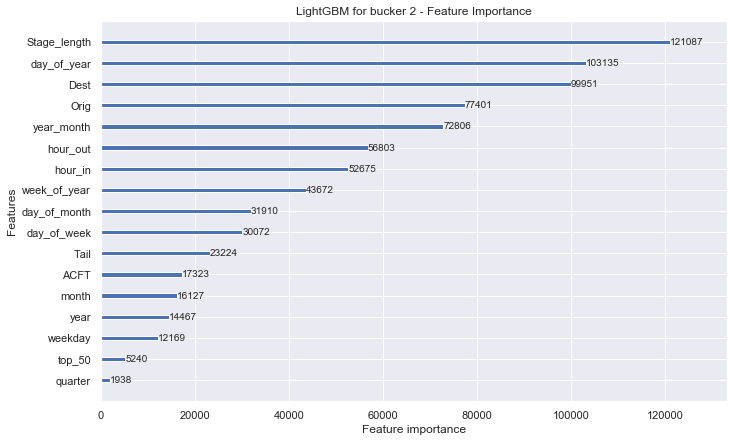

In [241]:
fig, ax = plt.subplots(figsize=(10, 7))
lgb.plot_importance(lgb_clf, max_num_features=30, ax=ax)
plt.title("LightGBM for bucker 2 - Feature Importance")
plt.savefig('/Users/Aifaz/Desktop/feature_importance_2nd_bucket.png') 

Printing all the percentage_off from the actual

In [225]:
accuracies = [0]

accuracies.append(gb_new['percent_off'].mean()*100)
accuracies.append(gb_new2['percent_off'].mean()*100)
accuracies.append(gb_new3['percent_off'].mean()*100)
accuracies.append(gb_new4['percent_off'].mean()*100)
accuracies.append(gb_new5['percent_off'].mean()*100)
accuracies.append(gb_new6['percent_off'].mean()*100)
accuracies.append(gb_new7['percent_off'].mean()*100)
accuracies.append(gb_new8['percent_off'].mean()*100)
accuracies.append(gb_new9['percent_off'].mean()*100)

<Figure size 1080x360 with 0 Axes>

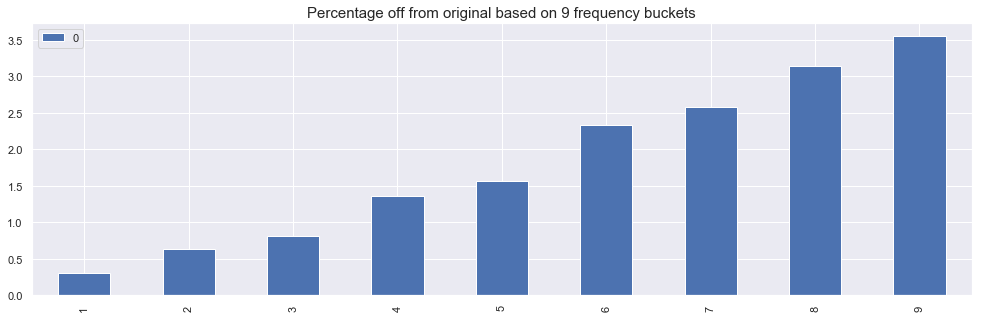

In [239]:
plt.figure(figsize=(15, 5))
acc_percent_by_decile = DataFrame(accuracies)[1:].plot(kind='bar', figsize = (15,5))
plt.title('Percentage off from original based on 9 frequency buckets', size=15)
plt.savefig('/Users/Aifaz/Desktop/acc.png')